In [1]:
import sys
sys.path.append('..')

import numpy as np
import networkx as nx
import sympy
from matplotlib import pyplot as plt
plt.style.use('ggplot')

import cirq
import qiskit
import pytket

import qleet

# Expressibility

In this section, we will learn how to calcualte expressibility of Parameterized Quantum Circuits (PQCs) using qLEET, which could thought of as traversing power of a PQC in the Hilbert space. We look at different parameterized states generated by the sampled ensemble of parameters for a given PQC. We then compare the resulting distribution of state fidelities generated by this sampled ensemble to that of the ensemble of Haar random states.

We currently support two expressibility measures - **Kullback–Leibler Divergence** and **Jensen–Shannon Divergence**
$$ Expr = D_{KL}(\hat{P}_{PQC}(F; \theta) | P_{Haar}(F)) $$
$$ Expr = D_{\sqrt{JSD}}(\hat{P}_{PQC}(F; \theta) | P_{Haar}(F)) $$

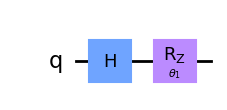

In [2]:
params = [qiskit.circuit.Parameter(r"$\theta_1$")]

qiskit_circuit = qiskit.QuantumCircuit(1)
qiskit_circuit.h(0)
qiskit_circuit.rz(params[0], 0)
qiskit_circuit.draw("mpl")

JSD Expressibility: 0.24224103325341462
KLD Expressibility: 0.2047388064539336


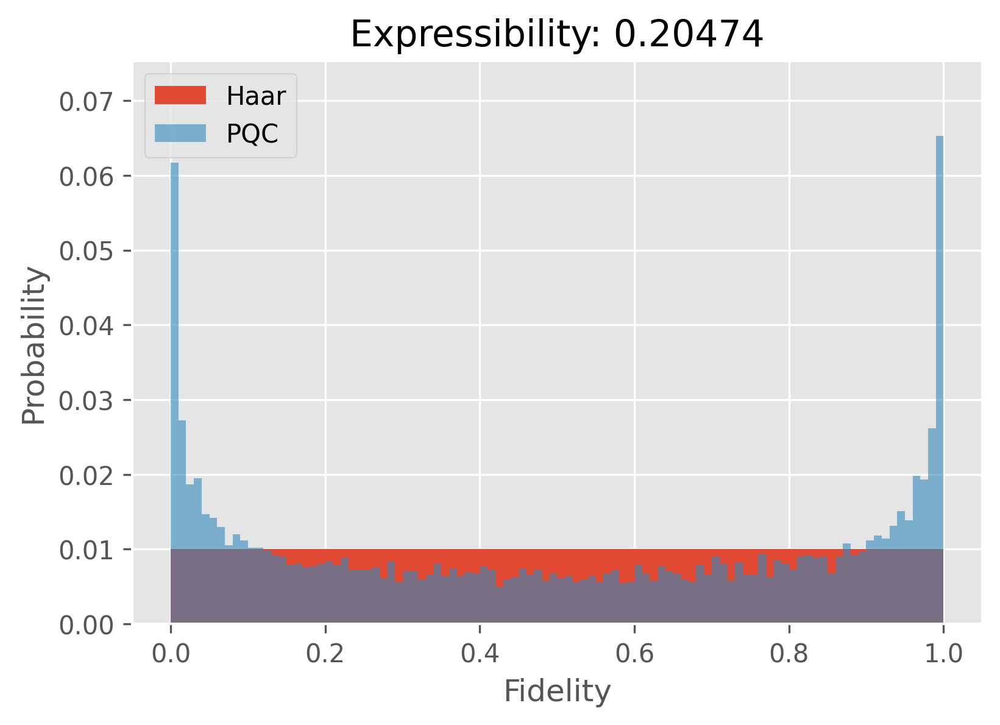

In [3]:
qiskit_descriptor = qleet.interface.circuit.CircuitDescriptor(
    circuit=qiskit_circuit, params=params, cost_function=None
)
qiskit_expressibility = qleet.analyzers.expressibility.Expressibility(
    qiskit_descriptor, samples=100
)
expr_jsd = qiskit_expressibility.expressibility("jsd")
print("JSD Expressibility:", expr_jsd)

expr_kld = qiskit_expressibility.expressibility("kld")
print("KLD Expressibility:", expr_kld)

plt_figure = qiskit_expressibility.plot()

# Entaganglement Power

In this section, we will learn how to calcualte entanglement spectrum of Parameterized Quantum Circuits (PQCs) using qLEET. We look at different parameterized states generated by the sampled ensemble of parameters for a given PQC. We then compare the resulting distribution of eigenvalues of the bipartite state generated by this sampled ensemble to that of the ensemble of eigenvalues of Haar random states.

We currently support two measures to calculate entanglement spectrum divergence (ESD) - **Kullback–Leibler Divergence** and **Jensen–Shannon Divergence**
$$ ESD = D_{KL}(\hat{P}_{PQC}(H_{\text{ent}}; \theta) | P_{Haar}(H_{\text{ent}})) $$
$$ ESD = D_{\sqrt{JSD}}(\hat{P}_{PQC}(H_{\text{ent}}; \theta) | P_{Haar}(H_{\text{ent}})) $$

1. Wiersema, Roeland, et al. “Exploring Entanglement and Optimization within the Hamiltonian Variational Ansatz.” PRX Quantum, vol. 1, no. 2, Dec. 2020, p. 020319. APS, https://doi.org/10.1103/PRXQuantum.1.020319.

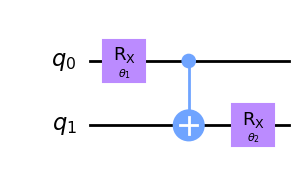

In [4]:
params = [
    qiskit.circuit.Parameter(r"$θ_1$"),
    qiskit.circuit.Parameter(r"$θ_2$")
]
qiskit_circuit = qiskit.QuantumCircuit(2)
qiskit_circuit.rx(params[0], 0)
qiskit_circuit.cx(0, 1)
qiskit_circuit.rx(params[1], 1)
qiskit_circuit.draw("mpl")

In [5]:
qiskit_descriptor = qleet.interface.circuit.CircuitDescriptor(
    circuit=qiskit_circuit, params=params, cost_function=None
)
analyzer = (
    qleet.analyzers.entanglement.EntanglementCapability(
        qiskit_descriptor, samples=500
    )
)

entanglement_mw = analyzer.entanglement_capability("meyer-wallach")
print("Entanglement Capability (Meyer Wallach Measure):", entanglement_mw)

entanglement_scott = analyzer.entanglement_capability("scott")
print("Entanglement Capability (Scott Measure):", entanglement_scott)

Entanglement Capability (Meyer Wallach Measure): 0.49558453670240066
Entanglement Capability (Scott Measure): [0.50066633]


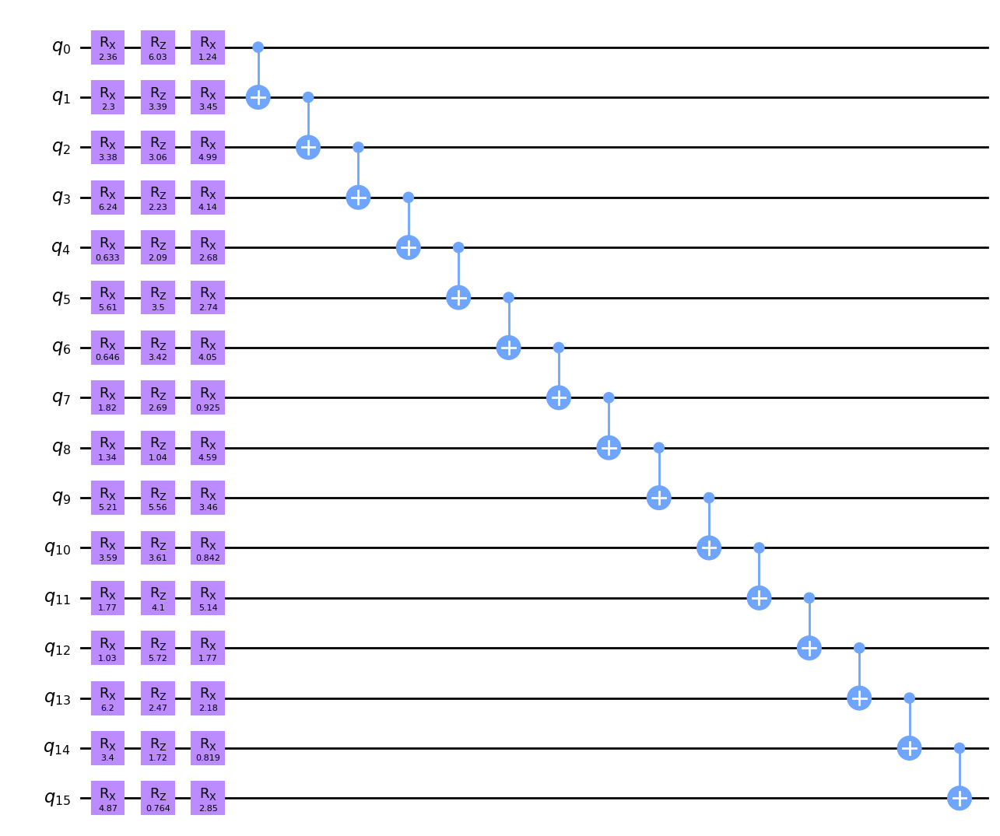

In [6]:
def ansatz(params, cparams=None):
    layers, num_qubits, depth = params.shape
    ansatz = qiskit.QuantumCircuit(num_qubits)
    for idx in range(layers):
        if idx:
            ansatz.barrier()
        for ind in range(num_qubits):
            ansatz.rx(params[idx][ind][0], ind)
            ansatz.rz(params[idx][ind][1], ind)
            ansatz.rx(params[idx][ind][2], ind)
        for ind in range(num_qubits-1):
            ansatz.cx(ind, ind+1)
    return ansatz

ansatz(np.random.uniform(0, 2*np.pi, (1, 16, 3))).draw("mpl")

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

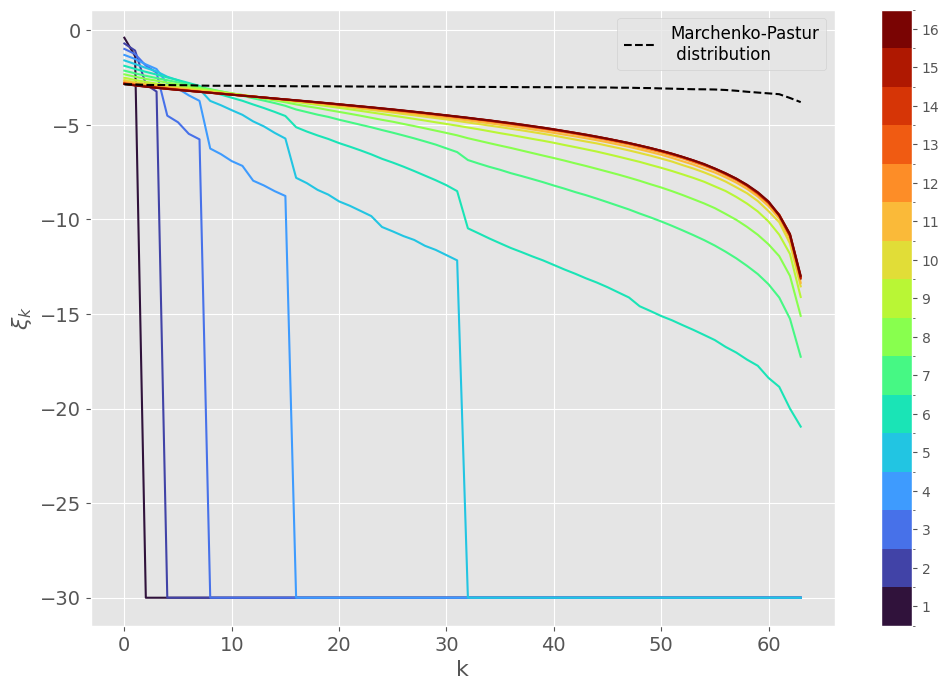

In [7]:
data = []
results = []
num_qubits = 12
for idx in range(1, 17):
    print(idx, end=' ')
    params = np.array([qiskit.circuit.Parameter(fr"$θ_{idx}$")
                       for idx in range(idx*num_qubits*3)])
    qiskit_descriptor = qleet.CircuitDescriptor(
        circuit=ansatz(np.array(params).reshape((idx, num_qubits, 3))), 
        params=params, cost_function=None
    )
    qiskit_entanglement_spectrum = \
        qleet.analyzers.entanglement_spectrum.EntanglementSpectrum(
            qiskit_descriptor, samples=100
        )
    pqc_esd, mean_eig = qiskit_entanglement_spectrum.entanglement_spectrum("jsd")
    results.append(pqc_esd)
    data.append(mean_eig)
data = np.array(data)

fig = qiskit_entanglement_spectrum.plot(data)

# Loss Landscape and Training Trajectory

The next part of the tutorial focusses on plotting a dimentionality-reduced loss landscape near the optima that is obtained. Smoother the surface, better the optimization process is, and usually a lower final loss is reached. The x-y axes of the plots represent a PCA of the parameters and the z-axis represents the value of the loss.

We also have training trajectory plots in 3-D and in 2-D, which represent the path the circuit in it's optimization process took over the parameter space. We plot this over several runs, if the trajectories from different runs mix with each other, the minima reached is probably optimal. If they don't mix, it's likely the the circuit is getting caught in different local optima.

For this section, we will be using Cirq to define our circuits and then using qLEET to analyze it.

In [2]:
graph = nx.gnm_random_graph(n=8, m=20)
qubits = cirq.GridQubit.rect(1, graph.number_of_nodes())
p = 5

params = sympy.symbols("q0:%d" % (2 * p))
qaoa_circuit = cirq.Circuit()
for qubit in qubits:
    qaoa_circuit.append(cirq.H(qubit))
for i in range(p):
    for edge in graph.edges():
        qaoa_circuit += cirq.CNOT(qubits[edge[0]], qubits[edge[1]])
        qaoa_circuit += cirq.rz(params[2 * i]).on(qubits[edge[1]])
        qaoa_circuit += cirq.CNOT(qubits[edge[0]], qubits[edge[1]])
    for j in range(len(qubits)):
        qaoa_circuit += cirq.rx(2 * params[2 * i + 1]).on(qubits[j])

qaoa_cost = cirq.PauliSum()
for edge in graph.edges():
    qaoa_cost += cirq.PauliString(1 / 2 * cirq.Z(qubits[edge[0]]) * 
                                  cirq.Z(qubits[edge[1]]))

circuit = qleet.interface.circuit.CircuitDescriptor(
    qaoa_circuit, params, qaoa_cost)
solver = qleet.simulators.pqc_trainer.PQCSimulatedTrainer(circuit)


class MaxCutMetric(qleet.interface.metric_spec.MetricSpecifier):

    def __init__(self, graph):
        super().__init__("samples")
        self.graph = graph

    def from_samples_vector(self, samples_vector):
        return np.mean([nx.algorithms.cuts.cut_size(self.graph, np.where(cut)[0]) for cut in samples_vector])
    
    def from_density_matrix(self, density_matrix):
        raise NotImplementedError
    
    def from_state_vector(self, state_vector):
        raise NotImplementedError


metric = MaxCutMetric(graph)

In [3]:
plot = qleet.analyzers.loss_landscape.LossLandscapePlotter(
    solver, metric, dim=2)
solver.train(n_samples=5000)
fig_loss_surface = plot.plot("surface", points=20)

trackers = qleet.interface.metas.AnalyzerList(
    qleet.analyzers.training_path.LossLandscapePathPlotter(plot),
    qleet.analyzers.training_path.OptimizationPathPlotter(mode="tSNE"),
)
for _i in range(5):
    solver = qleet.simulators.pqc_trainer.PQCSimulatedTrainer(circuit)
    solver.train(loggers=trackers, n_samples=5000)
    trackers.next()
    

fig_loss_traversal = trackers[0].plot()
fig_training_trace = trackers[1].plot(large_marker_size=100)

In [4]:
fig_loss_surface.update_layout(
    title=None,
    scene=dict(
        xaxis_title="Parameter PCA-1",
        yaxis_title="Parameter PCA-2",
        zaxis_title="Max-Cut Metric"
    ),
    scene_camera=dict(
        up=dict(x=0, y=0, z=1),
        center=dict(x=0, y=0, z=-0.22),
        eye=dict(x=1.25, y=1.25, z=1.25)
    ),
)

In [5]:
fig_loss_traversal.update_layout(
    title=None,
    scene=dict(
        xaxis_title="Parameter PCA-1",
        yaxis_title="Parameter PCA-2",
        zaxis_title="Loss"
    ),
    scene_camera=dict(
        up=dict(x=0, y=0, z=1),
        center=dict(x=0, y=0, z=-0.22),
        eye=dict(x=1.25, y=1.25, z=1.25)
    ),
)
fig_loss_traversal

In [6]:
fig_training_trace.update_layout(
    title=None,
    xaxis_title="Parameter tSNE-1",
    yaxis_title="Parameter tSNE-2",
)
fig_training_trace

In [7]:
fig_loss_surface.write_image("qleet-image-1.pdf")
fig_loss_traversal.write_image("qleet-image-2.pdf")
fig_training_trace.write_image("qleet-image-3.pdf")